  # Image Mosacing and Stereo Correspondences

## Image Mosacing

Steps:
1. Detect and describe keypoints in the images using ORB feature extractors
2. Matching the extracted keypoints using KNN matcher. MAtching is done using euclidean distance.
3. The matching key points are extracted and ratio testing is performed to save relevant points.
4. Homography is calculated using the points
5. Stiching is done conditioned on the computed homography.

In [1]:
import cv2
import copy
import imutils
import numpy as np
import matplotlib.pyplot as plt

inputs = '../images/Image Mosaicing/'

In [2]:
feature_extractor = 'orb'
feature_matching = 'bf'

In [3]:
def plot_image(img, title="Image"):
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig = plt.figure(figsize = (8,8))
    plt.imshow(img)
    plt.title(title)
    plt.xticks([]), plt.yticks([])
    plt.show()

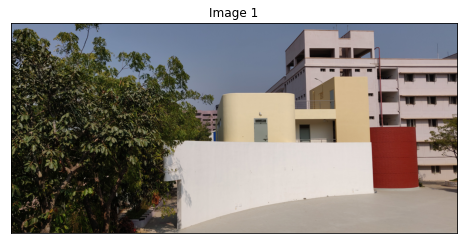

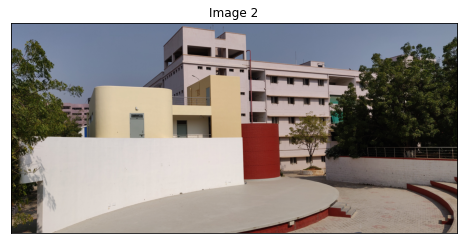

In [4]:
img1 = cv2.imread(inputs + '1_1.jpg')
plot_image(img1, "Image 1")
img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)

img2 = cv2.imread(inputs + '1_2.jpg')
plot_image(img2, "Image 2")
img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

In [5]:
def detectAndDescribe(image, method=None):
    """
        Compute key points and feature descriptors using an ORB feature descriptor.
    """
    # Initialize the ORB descriptor
    descriptor = cv2.ORB_create(nfeatures=5000)
        
    # get keypoints and descriptors
    (kps, features) = descriptor.detectAndCompute(image, None)
    
    return (kps, features)

In [6]:
kpsA, featuresA = detectAndDescribe(img2_gray, method=feature_extractor)
kpsB, featuresB = detectAndDescribe(img1_gray, method=feature_extractor)

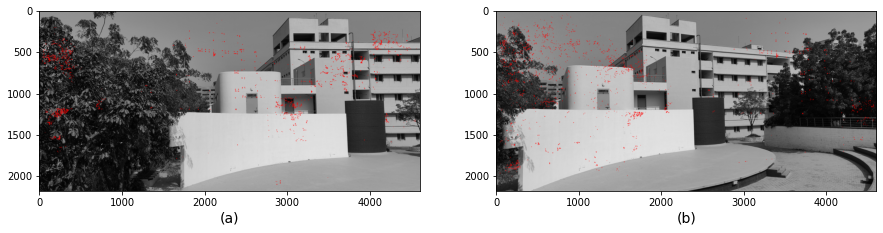

In [7]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(img1_gray,kpsA,None,color=(255,0,0),flags=0))
ax1.set_xlabel("(a)", fontsize=14)
ax2.imshow(cv2.drawKeypoints(img2_gray,kpsB,None,color=(255,0,0),flags=0))
ax2.set_xlabel("(b)", fontsize=14)

plt.show()

In [8]:
def matchKeyPointsKNN(featuresA, featuresB, ratio):
    '''
        finds matching keypoints using a KNN based Brute Force Matcher
    '''
    
    # Create and return a Matcher Object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)

    # compute the raw matches and initialize the list of actual matches
    rawMatches = bf.knnMatch(featuresA, featuresB, 2)
    matches = []

    # loop over the raw matches
    for m,n in rawMatches:
        # ensure the distance is within a certain ratio of each
        # other (i.e. Lowe's ratio test)
        if m.distance < n.distance * ratio:
            matches.append(m)
    return matches

In [9]:
matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.7)

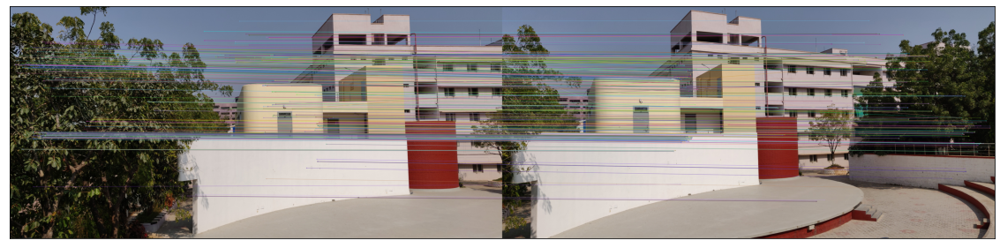

In [10]:
matched_img = cv2.drawMatches(img1.copy(), kpsA, img2.copy(), kpsB, matches, None,
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img = cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (20,20))
plt.xticks([]), plt.yticks([])
plt.imshow(img)
plt.show()

In [11]:
def getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh):
    '''
        Computes and returns the homography between 2 images based on their keypoints and returns
        homography matrix
    '''
    # convert the keypoints to numpy arrays
    kpsA = np.float32([kp.pt for kp in kpsA])
    kpsB = np.float32([kp.pt for kp in kpsB])
    
    if len(matches) > 4:

        # construct the two sets of points
        ptsA = np.float32([kpsA[m.queryIdx] for m in matches])
        ptsB = np.float32([kpsB[m.trainIdx] for m in matches])
        
        # estimate the homography between the sets of points
        (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,reprojThresh)

        return (matches, H, status)
    else:
        return None

In [12]:
M = getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh=5)
(matches, H, status) = M
print(H)

[[ 5.85634232e-01 -1.26330591e-02  1.51037052e+03]
 [-1.04747165e-01  8.40686919e-01  2.15347907e+02]
 [-8.90242256e-05 -7.86000050e-06  1.00000000e+00]]


In [13]:
def computeHomography(img1,img2):
    '''
        Takes as input the images and computes and returns the homography matrix between the images
    '''
    # Convert input image to grayscale
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
    
    # Computes the keypoints and feture descriptors
    kpsA, featuresA = detectAndDescribe(img2_gray, method=feature_extractor)
    kpsB, featuresB = detectAndDescribe(img1_gray, method=feature_extractor)
    
    # Computes the matching points based on Brute Force matcher
    matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.7)
    
    # Compute the homography matrix
    M = getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh=5)
    (matches, H, status) = M
    
    return H

In [14]:
def stitchImages(img1, img2, H, shape):
    '''
        Stiches both the images conditiones on the obtained homography
    '''
    
    # warpPerspective() transforms the image according to the computed homography
    result = cv2.warpPerspective(img2, H, shape)

    # Images put together to make the final stiched image
    result[0:img1.shape[0], 0:img1.shape[1]] = img1
    
    return result

In [15]:
def plotCorrection(image):
    '''
        Correctes the stiched immages to remove the black pixels from the stiched image
    '''
    
    #Convert to grayscale and threshold the image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

    # Finds contours from the binary image
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)

    # get the maximum contour area
    c = max(cnts, key=cv2.contourArea)

    # get a bbox from the contour area
    (x, y, w, h) = cv2.boundingRect(c)

    # crop the image to the bbox coordinates
    img = image[y:y + h, x:x + w]

    # show the cropped image
    plt.figure(figsize=(20,15))
    plt.axis('off')
    plt.imshow(img)
    plt.show()
    return img

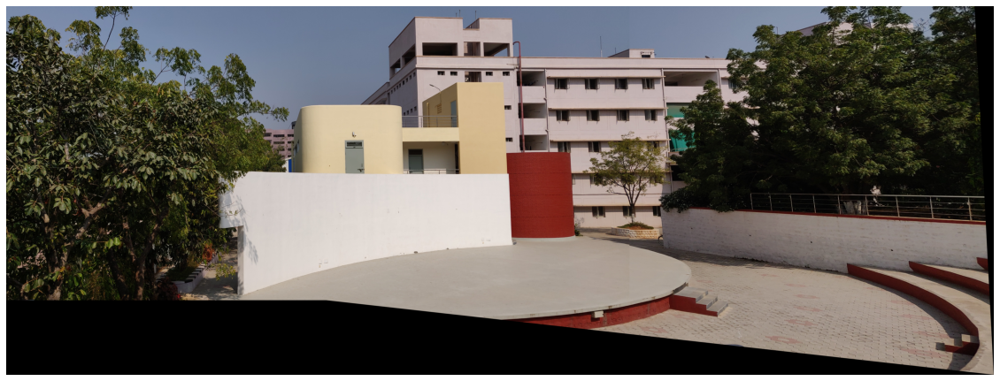

In [16]:
H = computeHomography(img1,img2)
shape = (img1.shape[1] + img2.shape[1],2*img1.shape[0])
image = stitchImages(img1, img2, H, shape)
res = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
i = plotCorrection(res)

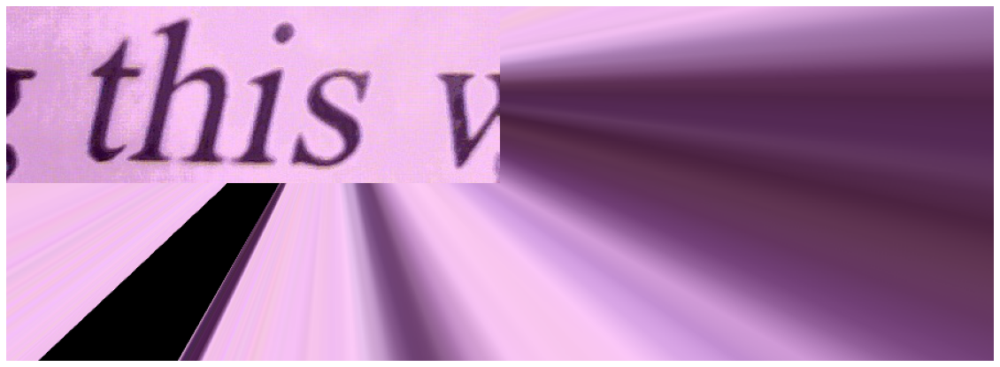

In [17]:
img1 = cv2.imread(inputs + '4_1.jpg')
img2 = cv2.imread(inputs + '4_2.jpg')

H = computeHomography(img1,img2)
shape = (img1.shape[1] + img2.shape[1],2*img1.shape[0])
image = stitchImages(img1, img2, H, shape)

res = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
i = plotCorrection(res)

These 2 images donot get stiched properly because the matching points are not proper and most of them are of either same intensity or are very similar t eachother so multiple points in both images are matched. Hence the results on this are bad.

In [18]:
img1 = cv2.imread(inputs + "1_1.jpg")
img2 = cv2.imread(inputs + "1_2.jpg")
img3 = cv2.imread(inputs + "1_3.jpg")
img4 = cv2.imread(inputs + "1_4.jpg")
h,w,c = img1.shape

H12 = computeHomography(img1, img2)
H23 = computeHomography(img2, img3)
H34 = computeHomography(img3, img4)

H13 = H12 @ H23
H14 = H13 @ H34

res1 = stitchImages(img1, img2, H12, (img2.shape[1],2*h))
res2 = stitchImages(res1, img3, H13, (res1.shape[1] + img3.shape[1],3*h))
res3 = stitchImages(res2, img4, H14, (res2.shape[1] + img4.shape[1],4*h))


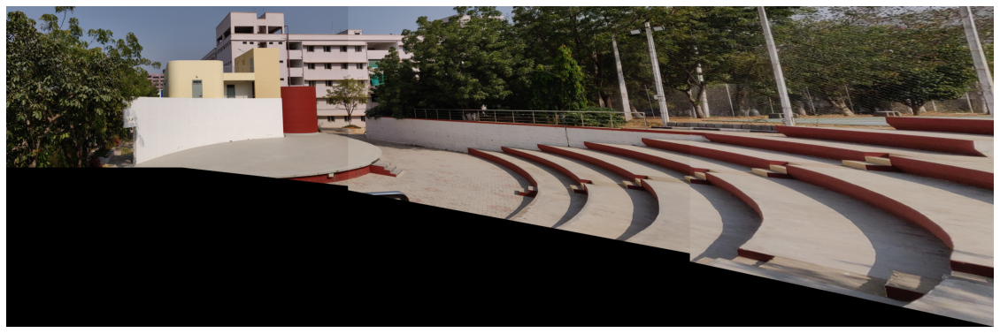

In [19]:
res = cv2.cvtColor(res3, cv2.COLOR_BGR2RGB)

i = plotCorrection(res)

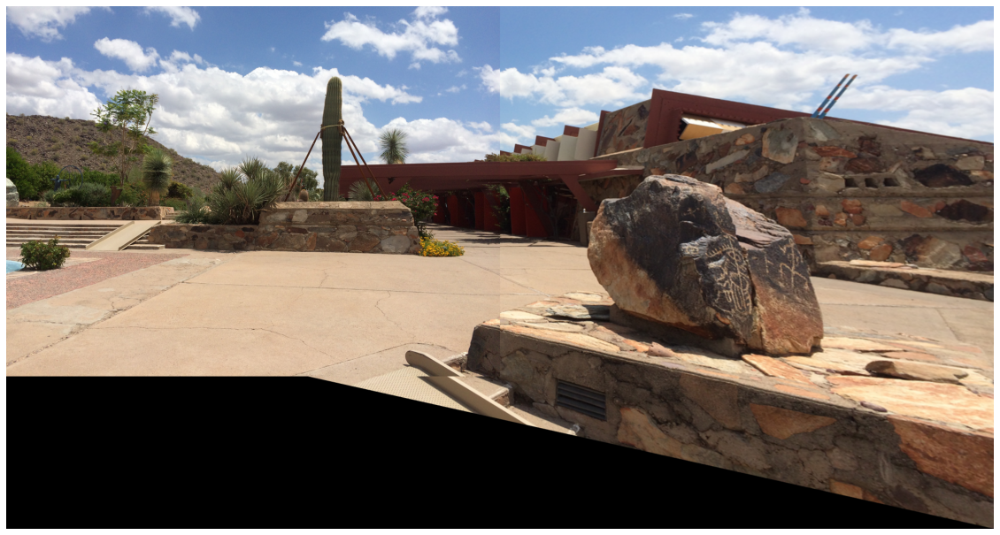

In [20]:
img1 = cv2.imread(inputs + '3_1.png')
img2 = cv2.imread(inputs + '3_2.png')

H = computeHomography(img1,img2)
shape = (img1.shape[1] + img2.shape[1],2*img1.shape[0])
image = stitchImages(img1, img2, H, shape)

res = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
i = plotCorrection(res)

In [21]:
# Stiching together the upper 3 images
img1 = cv2.imread(inputs + "2_1.png")
img2 = cv2.imread(inputs + "2_2.png")
img3 = cv2.imread(inputs + "2_3.png")
h,w,c = img1.shape

H12 = computeHomography(img1, img2)
H23 = computeHomography(img2, img3)
H13 = H12 @ H23

res1 = stitchImages(img1, img2, H12, (img2.shape[1],2*h))
res2 = stitchImages(res1, img3, H13, (res1.shape[1] + img3.shape[1],2*h))

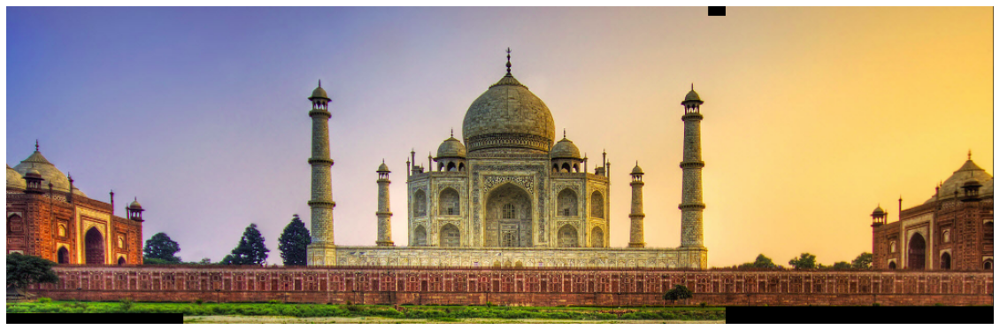

In [22]:
res = cv2.cvtColor(res2, cv2.COLOR_BGR2RGB)
im1 = plotCorrection(res)

In [23]:
# Stiching together the lower 3 images
img4 = cv2.imread(inputs + "2_4.png")
img5 = cv2.imread(inputs + "2_5.png")
img6 = cv2.imread(inputs + "2_6.png")
h,w,c = img4.shape


H45 = computeHomography(img4, img5)
H56 = computeHomography(img5, img6)
H46 = H45 @ H56

res3 = stitchImages(img4, img5, H45, (img5.shape[1],2*h))
res4 = stitchImages(res3, img6, H46, (res1.shape[1] + img6.shape[1],2*h))

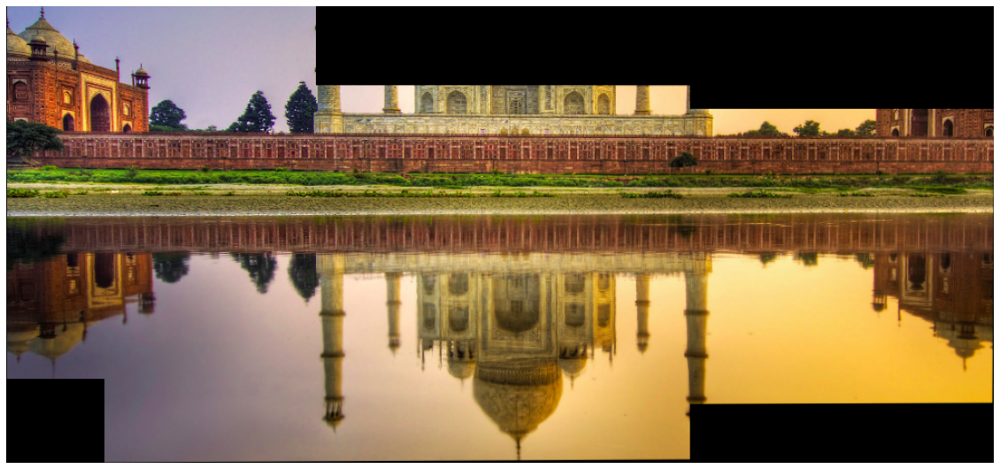

In [24]:
res = cv2.cvtColor(res4, cv2.COLOR_BGR2RGB)
im2 = plotCorrection(res)

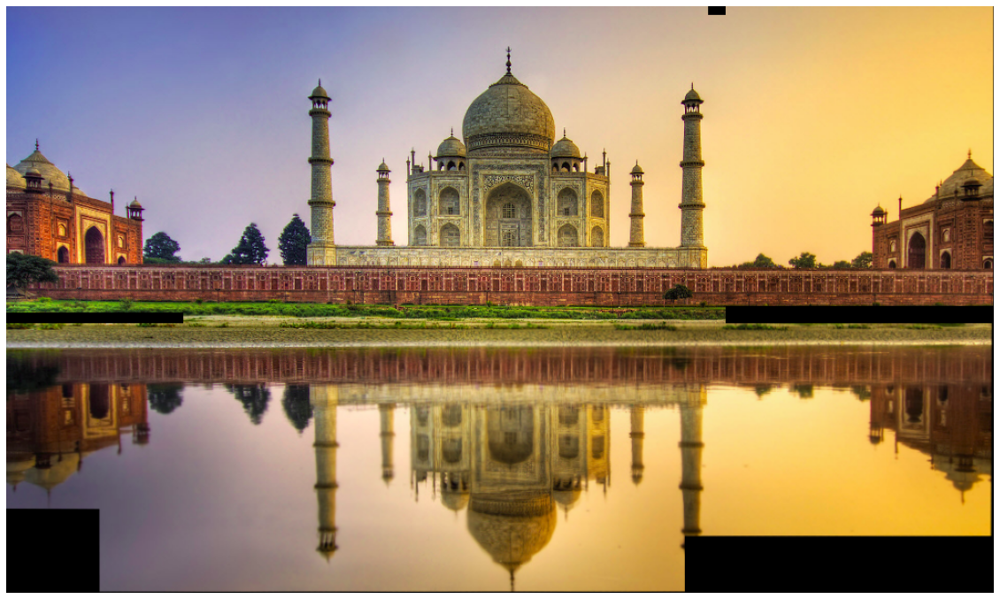

In [25]:
# Stiching together the upper and lower images
H = computeHomography(im1,im2)
shape = (2*im1.shape[1] ,2*im1.shape[0])
image = stitchImages(im1, im2, H, shape)
i = plotCorrection(image)

## Stereo Correspondance

### 1. Intensity based correlation

In this method, we try to find the correspondance between the pair of stereo images using intensity window-based correlation method. Here, the matching process is applied directly to the intensity profiles of the two images. The correlation is computed between the windows in the two images and the correspondance is obtained. The correlation function is given by:

$ 
\begin{equation} 
correlation = \frac{w_2^Tw_1}{\sqrt{w_1^Tw_1} \sqrt{w_2^Tw_2}} \tag{1}
\end{equation}
$

In [26]:
def intensityCorrelation(p1, p2):
    '''
        Computes the correlation value from the 2 given flattened vector patches
    '''
    
    #If any of the norm of any vector is 0, return -1
    if np.sqrt(p1.T@p1) == 0:
        return -1
    if np.sqrt(p2.T@p2) == 0:
        return -1
    
    # Compute the correlation value
    correlation = p1.T@p2/((np.sqrt(p1.T@p1))*(np.sqrt(p2.T@p2)))
    return correlation

In [27]:
def getCorrespondance(img, patch):
    '''
        Returns the corresponding image point to the patch centre in 2nd image 
    '''
    k = patch.shape[0]
    best = 0
    patch = patch.flatten()
    point = -1
    
    # Looping over all the points in the 2nd image
    for i in range(int(k/2), img.shape[0]-int(k/2)):
        res = 0
        for j in range(int(k/2), img.shape[1]-int(k/2)):
            p1 = img[i - int(k/2): i + int(k/2) + 1, j - int(k/2): j + int(k/2) + 1].flatten()
            p1 = p1 - np.mean(p1)
            p2 = patch - np.mean(patch)
            
            # Passing each extracted patch and the input patch to find correspondance
            res = max(res,intensityCorrelation(p1, p2))
            if best < res:
                best = res
                point = [i,j]
                
    return point

In [28]:
def draw_matches(img1, img2, src, dst):
    '''
        Draw the matching points in both the images connected by lines
    '''
    r,c,_ = img1.shape
    img3 = np.zeros((r,2*c,3))
    img3[:,:c,:] = img1
    img3[:,c:,:] = img2
    
    for s,d in zip(src, dst):
        color = tuple(np.random.randint(0,255,3).tolist())
        print(s,d)
        
        p = (s[0], s[1])
        q = (d[0]+c, d[1])
        
        lined = cv2.line(img3,p,q,color,1)
        lined = cv2.circle(lined,p,3,color,-1)
        lined = cv2.circle(lined,q,3,color,-1)
    plt.figure(figsize=(18,18))
    
    plt.imshow(lined.astype(np.uint8))
    plt.axis('off')
    plt.show()

[120  64] [121  75]
[146  52] [ 86 199]
[ 79 113] [138 234]
[22 72] [23 86]
[160 175] [160 191]
[204 121] [204 129]
[10 20] [10 38]
[ 15 180] [ 15 203]
[50 30] [50 45]
[220  10] [148 268]
[200  80] [200  89]
[250 150] [137 241]
[100 100] [121  82]
[150 190] [151 208]


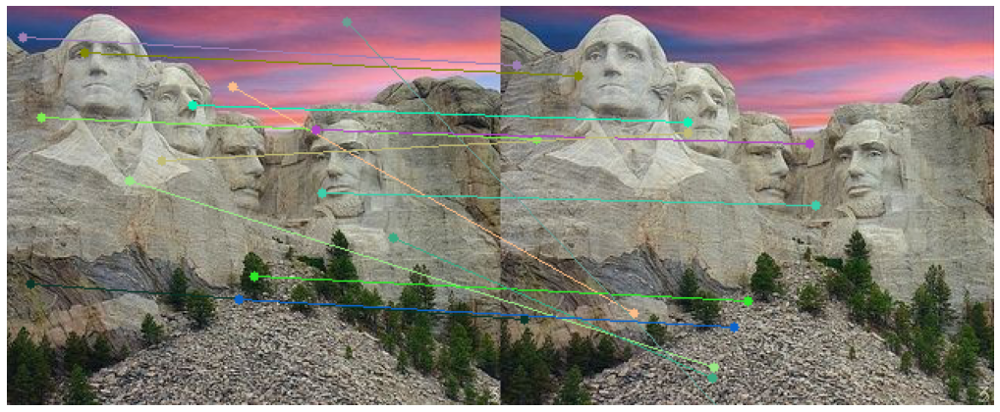

In [29]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
src_pts = np.array([[120,64], [146,52], [79,113], [22,72], [160,175], [204,121], [10,20], [15,180], [50,30], [220,10], [200,80], [250,150], [100,100], [150,190]])
dest_pts = []
neb = 7
for src in src_pts:
    dest_pts.append(getCorrespondance(img2, img1[src[0]-int(neb/2):src[0]+int(neb/2)+1, src[1]-int(neb/2):src[1]+int(neb/2)+1]))
dst_pts = np.asarray(dest_pts)
draw_matches(img1, img2, src_pts, dst_pts)

### 2. Stereo Rectification

Steps:
1. Calculate stereo correspondences between the two images(using ORB feature matching, defined in question 1).
2. Calculate the fundamental matrix for the given pair of images from the matches found.
3. Project the two images to the same plane after calculating the homography for both the images(rectified).

In [30]:
def stereoRectifyImages(img1, img2):
    '''
        Computes the Homographies from the matching points in both images extracted 
        using SIFT extractors and performs rectification of both the images 
    '''
    
    pts1 = []
    pts2 = []
    
    # Convert to gray scale images
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
    
    # Extract the keypoints and feature descriptors
    kpsA, featuresA = detectAndDescribe(img1_gray, method=feature_extractor)
    kpsB, featuresB = detectAndDescribe(img2_gray, method=feature_extractor)

    # Find the matching points
    matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.5)
    
    # Filter the matching points
    for mat in matches:
        pts1.append(kpsA[mat.queryIdx].pt)
        pts2.append(kpsB[mat.trainIdx].pt)
    pts1 = np.asarray(pts1, dtype = np.float32)
    pts2 = np.asarray(pts2, dtype = np.float32)
    
    # Compute the Fundamental matrix for the images and iage masks
    F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.RANSAC)
    
    # Considering only the internal points
    pts1 = pts1[mask.ravel() == 1]
    pts2 = pts2[mask.ravel() == 1]
    img_size = (img1.shape[1], img1.shape[0])
    
    #Computing the individual homographies to rectify the images
    P, H1, H2 = cv2.stereoRectifyUncalibrated(pts1, pts2, F, img_size)
    
    # Transforming the images subjected to the homographies
    img1_corrected = cv2.warpPerspective(img1, H1, img_size)
    img2_corrected = cv2.warpPerspective(img2, H2, img_size)
    return img1_corrected, img2_corrected

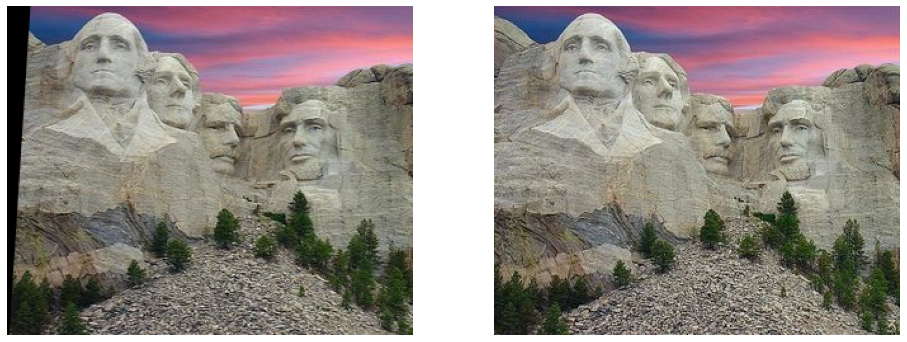

In [31]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg'),cv2.COLOR_BGR2RGB)

a,b = stereoRectifyImages(img1, img2)
fig = plt.figure(figsize=(16,16))
plt.subplot(1, 2, 1),plt.imshow(a.astype(np.uint8))
plt.axis('off')
plt.subplot(1, 2, 2),plt.imshow(b.astype(np.uint8))
plt.axis('off')
plt.show()

[120  64] [120  64]
[146  52] [146  52]
[ 79 113] [ 79 113]
[22 72] [22 72]
[160 175] [160 175]
[204 121] [204 121]
[20 20] [20 20]
[ 15 180] [ 15 180]
[50 30] [50 30]
[220  10] [220  10]
[200  80] [200  80]
[250 150] [250 150]
[100 100] [100 100]
[150 190] [150 190]


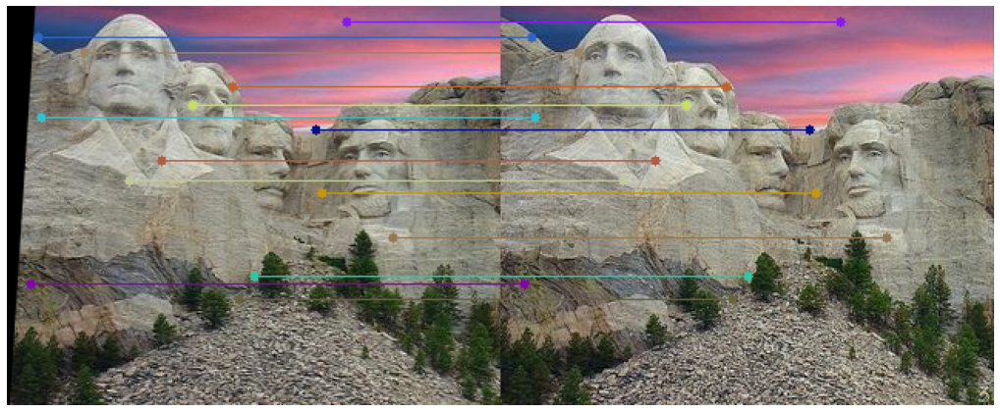

In [32]:
# Plotting the Correspondances on the rectified images
src_pts = np.array([[120,64], [146,52], [79,113], [22,72], [160,175], [204,121], [20,20], [15,180], [50,30], [220,10], [200,80], [250,150], [100,100], [150,190]])
dest_pts = []
neb = 7
for src in src_pts:
    dest_pts.append(getCorrespondance(b, b[src[0]-int(neb/2):src[0]+int(neb/2)+1, src[1]-int(neb/2):src[1]+int(neb/2)+1]))
dst_pts = np.asarray(dest_pts)
draw_matches(a, b, src_pts, dst_pts)

We observe that the correspondes on the rectified images are much better than the un rectifies images 

### 3. Plotting Epipolar lines

In Epipolar geometry, To find epipolar lines from 2 images of the same scene taken from different views, the corresponding matching points are found using SIFT feature detector. The Fundamental martix is computed from the points and then the epipolar lines are computed using the 8 point algorithm.

In [33]:
def drawlines(img1,img2,lines,pts1,pts2):
    '''
        img2 - image on which we draw the epilines for the points in img1
        lines - corresponding epilines
    '''
    r,c,_ = img1.shape
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, int(-r[2]/r[1]) ])
        x1,y1 = map(int, [c, int(-(r[2]+r[0]*c)/r[1]) ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img2 = cv2.circle(img2,tuple(pt2),4,color,-1)
        img2 = cv2.line(img2,(x0,y0), (x1,y1),color,1)
    return img1,img2

In [34]:
def findEpipolarLines(img1, img2):
    '''
        Computes the epipolar lines for corresponding points of image 1 in image 2
    '''
    pts1 = []
    pts2 = []
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

    kpsA, featuresA = detectAndDescribe(img1_gray, method=feature_extractor)
    kpsB, featuresB = detectAndDescribe(img2_gray, method=feature_extractor)

    matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.2)
    
    for mat in matches:
        pts1.append(kpsA[mat.queryIdx].pt)
        pts2.append(kpsB[mat.trainIdx].pt)
    pts1 = np.asarray(pts1, dtype = np.float32)
    pts2 = np.asarray(pts2, dtype = np.float32)
    
    F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.RANSAC)
    pts1 = pts1[mask.ravel() == 1]
    pts2 = pts2[mask.ravel() == 1]
    
    # Find epilines corresponding to points in left image (first image) and
    # drawing its lines on right image
    lines1 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 2,F)
    lines1 = lines1.reshape(-1,3)
    img5,img6 = drawlines(img2,img1,lines1,pts1,pts2)

    fig = plt.figure(figsize=(16,16))
    plt.subplot(121),plt.imshow(img6),plt.axis('off')
    plt.subplot(122),plt.imshow(img5),plt.axis('off')
    plt.show()

<ipython-input-33-000a0941c017>:12: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img2 = cv2.circle(img2,tuple(pt2),4,color,-1)


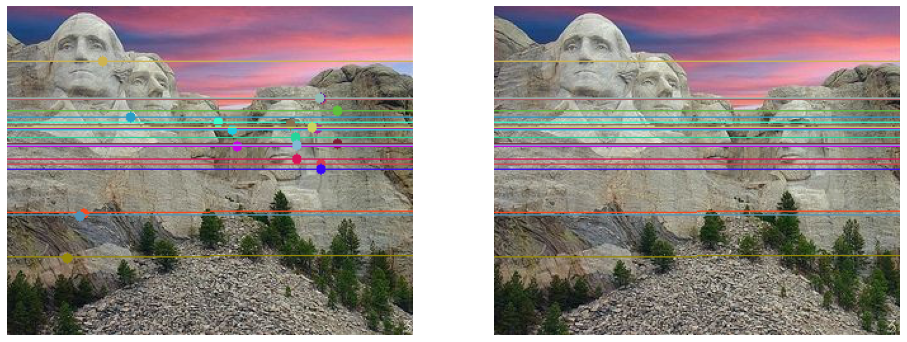

In [35]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
findEpipolarLines(img1, img2)

### 4. Greedy Correspondance Computation

In [36]:
def plot_matching_greedy(img, pts1, pts2, offset = 0, sz = 3):
    '''
        Plots the computed Corresponding points 
    '''
    if offset == 0:
        offset = int(img.shape[1] / 2)
    for i in range(pts1.shape[0]):
        color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.line(img, (int(pts1[i][1]), int(pts1[i][0])), (int(pts2[i][1]) + offset, int(pts2[i][0])), (255, 0, 0), 1)
        cv2.circle(img, (int(pts1[i][1]), int(pts1[i][0])), 1, color, sz)
        cv2.circle(img, (int(pts2[i][1]) + offset, int(pts2[i][0])), 1, color, sz)

In [37]:
def getGreedyMatch(img, patch, st_idx, row, stride = 1):
    '''
        Computes the corresponding point in the 2nd image using intensity based correlation
    '''
    img = img.astype(np.float64)
    patch = patch.astype(np.float64)
    sz = patch.shape[0]
    bestVal = 0
    pos = -1
    c = 0
    for i in range(row, row + 1):
        similar = 0
        for j in range(st_idx, img.shape[1] - int(sz / 2), stride):
            v = img[i - int(sz / 2): i + int(sz / 2) + 1, j - int(sz / 2): j + int(sz / 2) + 1].flatten()
            v = v - np.mean(v)
            p = patch.flatten() - np.mean(patch.flatten())
            similar = max(similar, intensityCorrelation(v, p))
            
            if bestVal < similar:
                bestVal = similar
                pos = [i, j]
    return pos

In [38]:
def greedilyIntensityBasedMatching(img1, img2, neighbourhood, row_stride = 50, col_stride = 50):
    '''
        Computes the corresponding points using greedy thresholding
    '''
    pts2 = []
    pts1 = []
    for i in range(int(neighbourhood / 2), img1.shape[0] - int(neighbourhood / 2), row_stride):
        threshold = int(neighbourhood / 2)
        for j in range(int(neighbourhood / 2), img1.shape[1] - int(neighbourhood / 2), col_stride):
            r = i
            c = j
            if(img1[r][c][0] == 0 and img1[r][c][1] == 0 and img1[r][c][2] == 0):
                continue
            correspondence = getGreedyMatch(img2, img1[r - int(neighbourhood / 2) : r + int(neighbourhood / 2) + 1, c - int(neighbourhood / 2): c + int(neighbourhood / 2) + 1], threshold, r)
            try:
                k = correspondence[0]
            except:
                continue
            pts2.append(correspondence)
            pts1.append([r, c])
            threshold = correspondence[1] + 1
    pts2 = np.asarray(pts2)
    pts1 = np.asarray(pts1)
    return pts1, pts2

In [39]:
def display_images(images, rows, cols, size, title, subtitles):
    '''
        Display the greedy corresponding image stiched
    '''
    %matplotlib inline
    fig = plt.figure(figsize = size)
    c = 0
    sz = len(images)
    for i in range(rows):
        for j in range(cols):
            if sz == c:
                break
            ax1 = fig.add_subplot(rows, cols, c + 1)
            ax1.imshow(images[c].astype(np.uint8), cmap = 'gray')
            ax1.set_title(subtitles[c], fontsize = 20)
            c = c + 1
    plt.show()

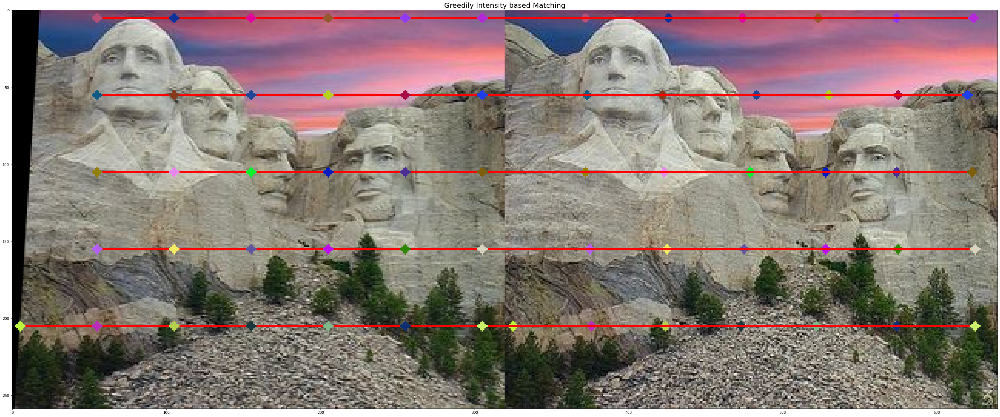

In [40]:
import random
images = []
subtitles = []
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
img1, img2 = stereoRectifyImages(img1, img2)

img = np.zeros((max(img1.shape[0], img2.shape[0]), img1.shape[1] + img2.shape[1], 3))
img = img.astype(np.uint8)
img[0:img1.shape[0], 0:img1.shape[1], :] = img1
img[0:img2.shape[0], img1.shape[1]:, :] = img2

pts1 = np.array([373])
pts1, pts2 = greedilyIntensityBasedMatching(img1, img2, 11)
plot_img = copy.deepcopy(img)
plot_matching_greedy(plot_img, pts1, pts2)
images.append(plot_img)
subtitles.append('Greedily Intensity based Matching')

display_images(images, 1, 1, (50, 50), '', subtitles)

### 5. Bonus: SIFT based matching

In [41]:
def detectKeyPoints(img):
    '''
        Compute and describe the key points and feature descriptors
    '''
    sift = cv2.ORB_create()
    kp1, des1 = sift.detectAndCompute(img, None)
    # Return Keypoint and Descriptors
    return kp1, des1

In [42]:
def findMatches(img1, img2, ratio = 0.7):
    '''
        Finds and returns the matching points
    '''
    kp1, des1 = detectKeyPoints(img1)
    kp2, des2 = detectKeyPoints(img2)
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k = 2)
    
    pts1 = []
    pts2 = []
    
    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < ratio*n.distance:
            good.append(m)
    
    for mat in good:
        pts1.append(kp1[mat.queryIdx].pt)
        pts2.append(kp2[mat.trainIdx].pt)
    pts1 = np.asarray(pts1, dtype = np.float32)
    pts2 = np.asarray(pts2, dtype = np.float32)
    return pts1, pts2

In [43]:
def plot_matching(img, pts1, pts2, offset = 0):
    '''
        Plots the matching keypoints in both images
    '''
    if offset == 0:
        offset = int(img.shape[1] / 2)
    for i in range(pts1.shape[0]):
        cv2.line(img, (int(pts1[i][1]), int(pts1[i][0])), (int(pts2[i][1]) + offset, int(pts2[i][0])), (255, 0, 0), 1)
        cv2.circle(img, (int(pts1[i][1]), int(pts1[i][0])), 1, (255, 0, 0), 4)
        cv2.circle(img, (int(pts2[i][1]) + offset, int(pts2[i][0])), 1, (255, 0, 0), 4)

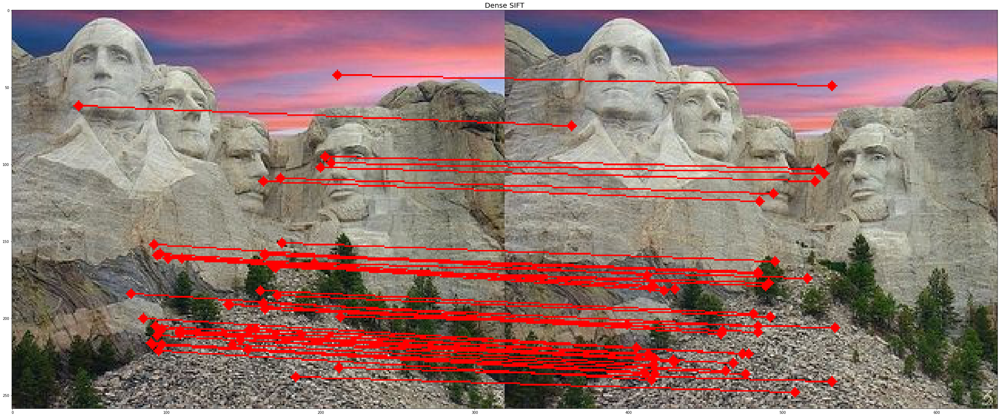

In [44]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
r,c,_ = img1.shape
img = np.zeros((r,2*c,3))
img[:,:c,:] = img1
img[:,c:,:] = img2
images = []
subtitles = []
# Dense SIFT based Matching
dense_sift_matching = copy.deepcopy(img)
pts1, pts2 = findMatches(img1, img2)
plot_matching(dense_sift_matching, pts1, pts2)
images.append(dense_sift_matching)
subtitles.append('Dense SIFT')
display_images(images, 1, 1, (50, 50), '', subtitles)

SIFT based matching gives much better results as conpared to intensity correlation based matching.